# 双层经典LSTM

## 模型训练

In [1]:
# 一维离散小波变换，模型存储
# 对不同传感器信号采用不同的小波级数和频带，降低输入通道数 2020.10.24
# 运行环境 anaconda 1.10.0, python 3.8.5 tensorflow 2.4.0, numpy 1.19.2, pywt 1.1.1, matplotlib 3.3.2
# i5-8400 8GB  

import pywt
import numpy as np

import matplotlib.pyplot as plt
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"    # 这一行注释掉就是使用gpu
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers, utils, backend, regularizers
import time

from tensorflow.core.protobuf import rewriter_config_pb2
from tensorflow.compat.v1.keras.backend import set_session
tf.keras.backend.clear_session()  # For easy reset of notebook state.
gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.9)
config_proto = tf.compat.v1.ConfigProto(gpu_options=gpu_options)
off = rewriter_config_pb2.RewriterConfig.OFF
config_proto.graph_options.rewrite_options.arithmetic_optimization = off
sess = tf.compat.v1.Session(config=config_proto)
set_session(sess)

TRAINDATA_LOADPATH = 'tool_wear_data_8/train_data.npy' #训练集数据读取路径
TRAINLABEL_LOADPATH = 'tool_wear_data_8/train_label.npy' #训练集标签读取路径
TESTDATA_LOADPATH = 'tool_wear_data_8/test_data.npy' #验证集数据读取路径
TESTLABEL_LOADPATH =  'tool_wear_data_8/test_label.npy' #验证集标签读取路径

SUMMARY_PATH = './logs'     #记录路径

MODEL_SAVE_PATH = 'flatten_period/model.h5'
MODEL_SAVE_PATH2 = 'flatten_period/model2.h5'

#输入数据
INPUT_SIZE = [2304, 7]
INPUT_NUM = INPUT_SIZE[1]

LSTM1_SIZE = 25
DENSE1_SIZE = 35
LSTM2_SIZE = 30
DENSE2_SIZE = 45

PREDICT_DENSE_SIZE = 300
OUTPUT_SIZE = 3

BATCH_SIZE = 64
PREDICTOR_TRAIN_BATCH1 = 10


##############################数据集读取########################################
X_train=np.load(TRAINDATA_LOADPATH)
Y_train=np.load(TRAINLABEL_LOADPATH)
X_test=np.load(TESTDATA_LOADPATH)
Y_test=np.load(TESTLABEL_LOADPATH)

#validation_split将样本集按先后比例分为训练集合样本集，样本数量应为两者和的整数倍
X_train = X_train[:(np.shape(X_train)[0]-np.shape(X_train)[0]%BATCH_SIZE), :,:INPUT_NUM]
Y_train = Y_train[:(np.shape(Y_train)[0]-np.shape(Y_train)[0]%BATCH_SIZE), :OUTPUT_SIZE]
X_test = X_test[:(np.shape(X_test)[0]-np.shape(X_test)[0]%BATCH_SIZE), :,:INPUT_NUM]
Y_test = Y_test[:(np.shape(Y_test)[0]-np.shape(Y_test)[0]%BATCH_SIZE), :OUTPUT_SIZE]

##############################################################################################频带模型搭建###############################################################
class temporal_Attention(layers.Layer):
    def __init__(self, **kwargs): 
        super(temporal_Attention,self).__init__(**kwargs)
    def build(self, input_shape): 
        self.u_query=self.add_weight(name='u_query',shape=[1, input_shape[2]], trainable=True, initializer='uniform')
        super(temporal_Attention,self).build(input_shape)
    def call(self, key):
        scores = tf.matmul(self.u_query, key, transpose_b=True)
        distribution = tf.nn.softmax(scores, axis = 2)
        value_weighted = tf.squeeze(tf.matmul(distribution, key), axis = 1)
        attention_distribution = tf.squeeze(distribution)
        return value_weighted, attention_distribution
    def compute_output_shape(self,input_shape):
        return (input_shape[0], input_shape[2]), (input_shape[0], input_shape[1])

#高低频时序特征提取
inputs = layers.Input(shape=INPUT_SIZE, batch_size = BATCH_SIZE)
x = layers.Bidirectional(layers.LSTM(LSTM1_SIZE, return_sequences=True, name='biLSTM'))(inputs)
key = layers.TimeDistributed(layers.Dense(DENSE1_SIZE))(x)
key = layers.TimeDistributed(layers.LeakyReLU())(key)
key = layers.LayerNormalization(axis = 1)(key)
feature, att_distribution = temporal_Attention()(key)

x = layers.Dense(PREDICT_DENSE_SIZE)(feature)
x = layers.LeakyReLU()(x)
x = layers.Dense(OUTPUT_SIZE, name='output')(x)
output = layers.LeakyReLU()(x)
predictor = models.Model(inputs=inputs, outputs=output, name='tool_wear_predictor')
att_distribution_model = models.Model(inputs=inputs, outputs=att_distribution, name = 'att_distribution_model')

predictor.summary()
#############################################模型训练#########################################################################
time_start = time.time()
adam = keras.optimizers.Adam(lr=0.008)
predictor.compile(optimizer=adam, loss = 'mse')
history = predictor.fit(X_train, Y_train, batch_size=BATCH_SIZE, validation_data = (X_test, Y_test),
                        epochs=PREDICTOR_TRAIN_BATCH1,  shuffle=True, verbose=1)
predictor.save(MODEL_SAVE_PATH)
att_distribution_model.save(MODEL_SAVE_PATH2)
print('time1 =  ', time.time()-time_start)


Model: "tool_wear_predictor"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(64, 2304, 7)]           0         
_________________________________________________________________
bidirectional (Bidirectional (64, 2304, 50)            6600      
_________________________________________________________________
time_distributed (TimeDistri (64, 2304, 35)            1785      
_________________________________________________________________
time_distributed_1 (TimeDist (64, 2304, 35)            0         
_________________________________________________________________
layer_normalization (LayerNo (64, 2304, 35)            4608      
_________________________________________________________________
temporal__attention (tempora ((64, 35), (64, 2304))    35        
_________________________________________________________________
dense_1 (Dense)              (64, 300)         

## 结果显示

loss_train_avg 0.001447722290453168
percent_train_avg 3.909467845190981 %
percent_train_avg[0] 4.152947267245097 %
percent_train_avg[1] 3.6064841030957244 %
percent_train_avg[2] 3.968972165232118 %
loss_test_avg 0.000509854210715808
percent_test_avg 2.9919156212007985 %
percent_test_avg[0] 3.010580736877018 %
percent_test_avg[1] 2.6930602934361714 %
percent_test_avg[2] 3.272105833289206 %


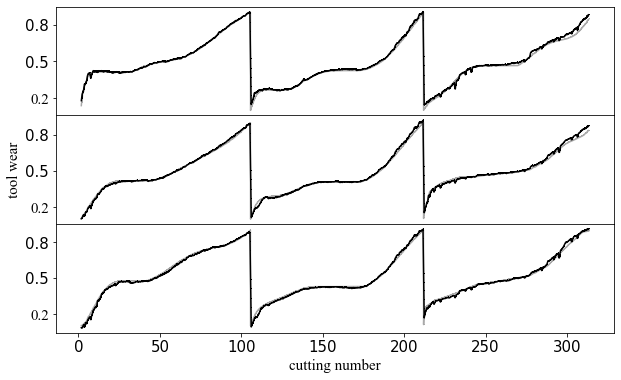

In [2]:
#
import numpy as np
import matplotlib.pyplot as plt
import pywt
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"    # 这一行注释掉就是使用gpu
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers, utils, backend
import time

from tensorflow.core.protobuf import rewriter_config_pb2
from tensorflow.compat.v1.keras.backend import set_session
tf.keras.backend.clear_session()  # For easy reset of notebook state.
gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.9)
config_proto = tf.compat.v1.ConfigProto(gpu_options=gpu_options)
off = rewriter_config_pb2.RewriterConfig.OFF
config_proto.graph_options.rewrite_options.arithmetic_optimization = off 
sess = tf.compat.v1.Session(config=config_proto)
set_session(sess)

TRAINDATA_LOADPATH = 'tool_wear_data_8/train_data.npy' #训练集数据读取路径
TRAINLABEL_LOADPATH = 'tool_wear_data_8/train_label.npy' #训练集标签读取路径
TESTDATA_LOADPATH = 'tool_wear_data_8/test_data.npy' #验证集数据读取路径
TESTLABEL_LOADPATH =  'tool_wear_data_8/test_label.npy' #验证集标签读取路径

MODEL_LOAD_PATH = 'flatten_period/model.h5'
MODEL_LOAD_PATH2 = 'flatten_period/model2.h5'


load_flag = 1 ########################################1:重新加载模型，0：不加载##########################
#输入数据
INPUT_SIZE = [2304, 7]  #[time_steps, input_vector]
INPUT_NUM = INPUT_SIZE[1]

OUTPUT_SIZE = 3
BATCH_SIZE = 64
size = 15

################################################### 波形显示 ##################################################
fig_x = 10
fig_y = 6
plt.figure(figsize=(fig_x, fig_y))
plt.subplots_adjust(wspace=0, hspace=0)
font1 = {'family':'Times New Roman', 'weight':'normal', 'size':size}

#train
score = predictor.evaluate(X_train, Y_train, verbose=0, batch_size = BATCH_SIZE)
Y_pre_train = predictor.predict(X_train, batch_size = BATCH_SIZE)

v = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
result = [np.convolve(Y_pre_train[:, 0], v, mode='same'), np.convolve(Y_pre_train[:, 1], v, mode='same'), 
          np.convolve(Y_pre_train[:, 2], v, mode='same')]
result = np.transpose(result)

axis = np.linspace(1, 314, np.shape(result)[0])
print('loss_train_avg', np.mean(np.square(result - Y_train)))
print('percent_train_avg', np.mean(np.abs(result - Y_train)/Y_train)*100, '%')
print('percent_train_avg[0]', np.mean(np.abs(result[:, 0] - Y_train[:, 0])/Y_train[:, 0])*100, '%')
print('percent_train_avg[1]', np.mean(np.abs(result[:, 1] - Y_train[:, 1])/Y_train[:, 1])*100, '%')
print('percent_train_avg[2]', np.mean(np.abs(result[:, 2] - Y_train[:, 2])/Y_train[:, 2])*100, '%')

#test
score = predictor.evaluate(X_test, Y_test, verbose=0, batch_size = BATCH_SIZE)
Y_pre_test = predictor.predict(X_test, batch_size = BATCH_SIZE)

v = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
result = [np.convolve(Y_pre_test[:, 0], v, mode='same'), np.convolve(Y_pre_test[:, 1], v, mode='same'), 
          np.convolve(Y_pre_test[:, 2], v, mode='same')]
result = np.transpose(result)

axis = np.linspace(1, 314, np.shape(result)[0])
print('loss_test_avg', np.mean(np.square(result - Y_test)))
print('percent_test_avg', np.mean(np.abs(result - Y_test)/Y_test)*100, '%')
print('percent_test_avg[0]', np.mean(np.abs(result[:, 0] - Y_test[:, 0])/Y_test[:, 0])*100, '%')
print('percent_test_avg[1]', np.mean(np.abs(result[:, 1] - Y_test[:, 1])/Y_test[:, 1])*100, '%')
print('percent_test_avg[2]', np.mean(np.abs(result[:, 2] - Y_test[:, 2])/Y_test[:, 2])*100, '%')
        
for i in range(3):
    plt.subplot(3,1,i+1)
#     fig.xaxis.set_major_locator(ticker.MultipleLocator(3))
    if i == 0:
        plt.plot(axis[10:-10], Y_test[10:-10, i],'darkgrey',marker = ',',label = 'actual tool wear')
        plt.plot(axis[10:-10], result[10:-10, i],color = 'k', marker = ',', label = 'predicted result')
#         plt.legend(loc= 2, prop = font1)
        plt.xticks([])
    if i == 1:
        plt.plot(axis[10:-10], Y_test[10:-10, i],'darkgrey',marker = ',')
        plt.plot(axis[10:-10], result[10:-10, i],color = 'k', marker = ',')
        plt.xticks([])
        plt.ylabel('tool wear', fontproperties = 'Times New Roman', size = size)
    if i == 2:
        plt.plot(axis[10:-10], Y_test[10:-10, i],'darkgrey',marker = ',')
        plt.plot(axis[10:-10], result[10:-10, i],color = 'k', marker = ',')
        plt.xticks(fontproperties = 'Times New Roman', size = size)
#         plt.xlabel('cutting number', fontproperties = 'Times New Roman', size = 20)
    plt.yticks([0.2, 0.5, 0.8], fontproperties = 'Times New Roman', size = size)

    
plt.xlabel('cutting number', fontproperties = 'Times New Roman', size = size)
plt.savefig('test_output.png', dpi = 300)
plt.show()

## 注意力权重存储及分布

att_distribution_value_detail (17088, 2304)


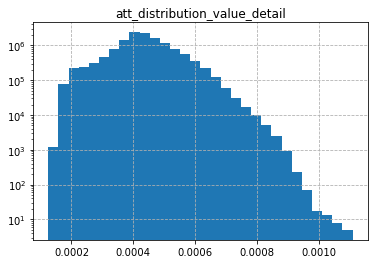

[9.21242246e-05 5.91759080e-03 1.73476239e-02 1.82589604e-02
 2.40548618e-02 3.56769919e-02 5.90843172e-02 1.10288851e-01
 1.81756142e-01 1.69843238e-01 1.23985338e-01 8.66481290e-02
 6.13092430e-02 4.18436000e-02 2.77149139e-02 1.72401838e-02
 9.29669822e-03 4.57641754e-03 2.33388989e-03 1.30756964e-03
 7.39813149e-04 3.96614218e-04 1.91106332e-04 6.99504038e-05
 1.70685081e-05 5.48630618e-06 1.29537785e-06 9.90583060e-07
 6.09589576e-07 3.80993485e-07]


In [3]:
#
from matplotlib.collections import LineCollection
from scipy.interpolate import interp1d
import pandas as pd
import seaborn as sns

ATT_DETAIL_SAVEPATH = 'flatten_period/attention_detail.npy'

att_distribution_value_detail = att_distribution_model.predict(X_train, batch_size = BATCH_SIZE)
np.save(ATT_DETAIL_SAVEPATH, att_distribution_value_detail)#(1280, 48)
print('att_distribution_value_detail', np.shape(att_distribution_value_detail))

plt.title('att_distribution_value_detail') 
a, b, c = plt.hist(att_distribution_value_detail[::3].reshape([-1]), bins=30, density=False, log=True)
plt.grid(linestyle='--')
plt.show()
print(a/np.sum(a))


## 注意力权重显示

att_distribution_value_detail (17088, 2304)


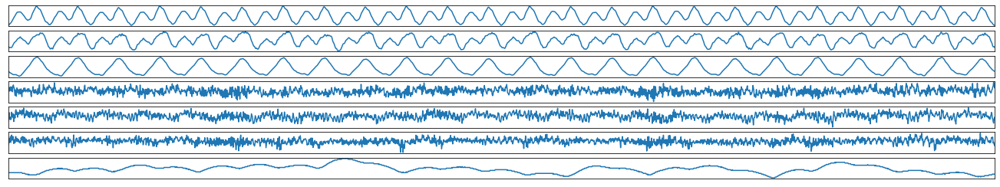

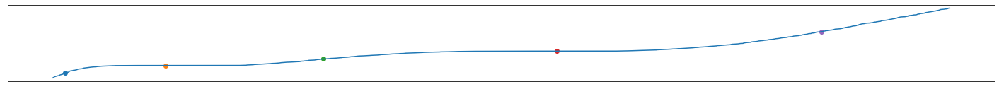

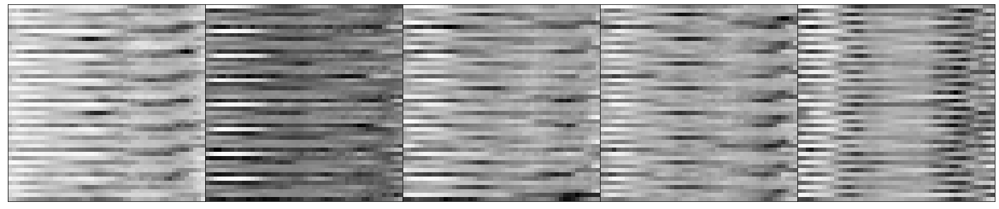

In [4]:
#注意力权重显示
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import normalize

HIGHFREQ_INPUT_SIZE = [2304, 6]
LOWFREQ_INPUT_SIZE = [288, 7]
ATTENTION_RANGE = 72

sample_index = 1000

ATT_LOCAL_LOADPATH = 'flatten_period/attention_local.npy'
ATT_LOWHIGH_LOADPATH = 'flatten_period/attention_lowhigh.npy'
ATT_DETAIL_LOADPATH = 'flatten_period/attention_detail.npy'
TESTDATA_LOADPATH = 'tool_wear_data_8/test_data.npy'

HIGHFREQ_FORCE_SAVEPATH = 'flatten_period/highfreq_force.png'
HIGHFREQ_VIBRATION_SAVEPATH = 'flatten_period/highfreq_vibration.png'
LOWFREQ_FORCE_SAVEPATH = 'flatten_period/lowfreq_force.png'
LOWFREQ_VIBRATION_SAVEPATH = 'flatten_period/lowfreq_vibration.png'
ATT_LOWHIGH_SAVEPATH = 'flatten_period/attention_lowhigh.png'
ATTENTION_SIGNAL_SAVEPATH = 'flatten_period/attention_signal.png'
LABEL_SAVEPATH = 'flatten_period/label.png'
ATTENTION_SIGNAL_SAVEPATH2 = 'flatten_period/attention_signal2.png'


att_distribution_value_detail = np.load(ATT_DETAIL_LOADPATH)
X_test = np.load(TESTDATA_LOADPATH)
print('att_distribution_value_detail', np.shape(att_distribution_value_detail))


fig_x = 23.04
fig_y = 6
plt.figure(figsize=(fig_x, fig_y))
for i in range(7):
    plt.subplot(10, 1, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.xlim(xmin=0)
    plt.xlim(xmax=2304)
    plt.plot(X_test[sample_index, :, i])

sample_list = [20, 180, 430, 800, 1220]
fig_x = 25
fig_y = 2
plt.figure(figsize=(fig_x, fig_y))
plt.plot(Y_test[1420:2845,0])

for i in sample_list:
    plt.scatter(i, Y_test[i+1420,0])
plt.xticks([])
plt.yticks([])
plt.savefig(LABEL_SAVEPATH, dpi = 300, bbox_inches='tight')
plt.show()

fig_x = 25
fig_y = 10
plt.figure(figsize=(fig_x, fig_y))
plt.subplots_adjust(wspace=0, hspace=0)
i = 0
for sample_index in sample_list:
    plt.subplot(1, 5, i+1)
    plt.imshow(att_distribution_value_detail[sample_index+1420].reshape([48,48]), cmap='Greys')
    plt.xticks([])
    plt.yticks([])
    i+=1
plt.savefig(ATTENTION_SIGNAL_SAVEPATH2, dpi = 300, bbox_inches='tight')
plt.show()

att_distribution_value_detail (4224, 2304)


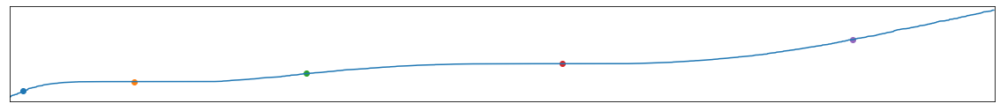

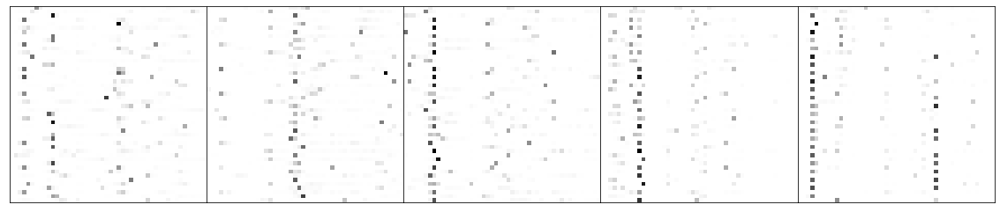

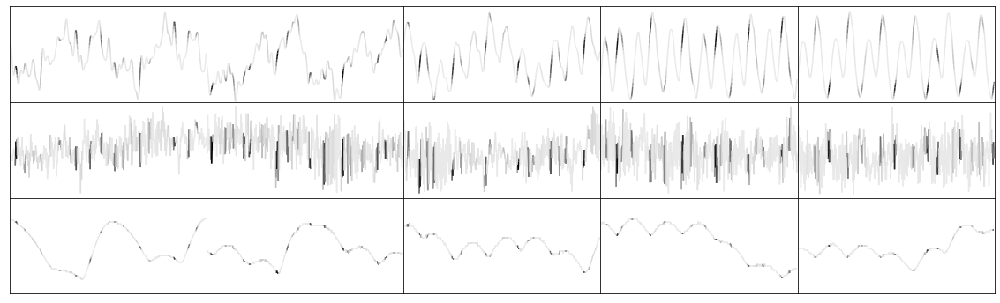

In [5]:
#注意力权重显示
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import normalize

HIGHFREQ_INPUT_SIZE = [2304, 6]
LOWFREQ_INPUT_SIZE = [288, 7]
ATTENTION_RANGE = 72
PADDING_LENGTH = int(ATTENTION_RANGE - HIGHFREQ_INPUT_SIZE[0]/LOWFREQ_INPUT_SIZE[0])
sample_index = 100

TESTDATA_LOADPATH = 'tool_wear_data_8/test_data.npy' #验证集数据读取路径
TESTLABEL_LOADPATH =  'tool_wear_data_8/test_label.npy' #验证集标签读取路径
# ATT_DETAIL_LOADPATH = 'flatten_period/attention_detail.npy'
ATT_DETAIL_LOADPATH = 'mismatch_period/attention_detail.npy'
# ATT_DETAIL_LOADPATH = 'mismatch_period_2/attention_detail.npy'

HIGHFREQ_FORCE_SAVEPATH = 'flatten_period/highfreq_force.png'
HIGHFREQ_VIBRATION_SAVEPATH = 'flatten_period/highfreq_vibration.png'
LOWFREQ_FORCE_SAVEPATH = 'flatten_period/lowfreq_force.png'
LOWFREQ_VIBRATION_SAVEPATH = 'flatten_period/lowfreq_vibration.png'
ATT_LOWHIGH_SAVEPATH = 'flatten_period/attention_lowhigh.png'
ATTENTION_SIGNAL_SAVEPATH = 'flatten_period/attention_signal.png'
LABEL_SAVEPATH = 'flatten_period/label.png'
ATTENTION_SIGNAL_SAVEPATH2 = 'flatten_period/attention_signal2.png'

X_test = np.load(TESTDATA_LOADPATH)
Y_test = np.load(TESTLABEL_LOADPATH)
att_distribution_value_detail = np.load(ATT_DETAIL_LOADPATH)
print('att_distribution_value_detail', np.shape(att_distribution_value_detail))

sample_list = [20, 180, 430, 800, 1220]
start_list = [200, 200, 200, 200, 200]
fig_x = 20
fig_y = 2
plt.figure(figsize=(fig_x, fig_y))
plt.plot(Y_test[1420:2845,0])
for i in sample_list:
    plt.scatter(i, Y_test[i+1420,0])
plt.xlim(0, np.shape(Y_test[1420:2845,0])[0])
plt.xticks([])
plt.yticks([])
plt.savefig(LABEL_SAVEPATH, dpi = 300, bbox_inches='tight')
plt.show()

i = 0
fig_x = 20
fig_y = 10
plt.figure(figsize=(fig_x, fig_y))
plt.subplots_adjust(wspace=0, hspace=0)
for sample_index in sample_list:
    plt.subplot(1, 5, i+1)
    plt.imshow(att_distribution_value_detail[sample_index+1420].reshape([48,48]), cmap='Greys')
    plt.xticks([])
    plt.yticks([])
    i+=1
plt.savefig(ATTENTION_SIGNAL_SAVEPATH, dpi = 300, bbox_inches='tight')
plt.show()


def gaussian_filtering(input_x, variation = 2, filter_length = 20):   #一维高斯滤波，输入方差、滤波器长度和输入
    filter_x = np.array(np.arange(-filter_length/2, filter_length/2))
    gauss_filter = np.exp(-pow(filter_x, 2)/(2*pow(variation, 2)))/(variation*np.sqrt(2*np.pi))
    gauss_filter = gauss_filter/np.sum(gauss_filter)
#     plt.plot(gauss_filter)
#     plt.show()
    filted_signal = np.convolve(input_x, gauss_filter, mode='same')
    return filted_signal

fig_index = 0
fig_x = 4
fig_y = 2
fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(20, 6))
fig.subplots_adjust(wspace=0, hspace=0)
axs = axs.flatten()
for i in range(np.shape(sample_list)[0]):
    X_sample = X_test[sample_list[i]+1420, start_list[i]:start_list[i]+int(np.shape(X_test)[1]/4), :]
    A_sample = att_distribution_value_detail[sample_list[i]+1420, start_list[i]:start_list[i]+int(np.shape(X_test)[1]/4)]
    A_sample = gaussian_filtering(A_sample)
    A_sample = (A_sample - np.min(A_sample))/(np.max(A_sample)-np.min(A_sample)) # 灰度值归一化到[0.3, 1]
    A_sample[0] = -0.2
    
    col_index = 0
    for j in [0, 3, 6]:
        points = np.transpose([np.arange(np.shape(X_sample)[0]), X_sample[:, j]]).reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        axs[i+5*col_index].set_xticks([])
        axs[i+5*col_index].set_yticks([])
        lc = LineCollection(segments, cmap='Greys')
        lc.set_array(A_sample)
        line = axs[i+5*col_index].add_collection(lc)
        axs[i+5*col_index].set_xlim(0, np.shape(X_sample)[0])
        axs[i+5*col_index].set_ylim(X_sample[:, j].min() - 0.1*np.abs(X_sample[:, j].min()), X_sample[:, j].max() + 0.1*np.abs(X_sample[:, j].max()))
        
        col_index+=1
plt.savefig(ATTENTION_SIGNAL_SAVEPATH2, dpi = 300, bbox_inches='tight')
plt.show()


(4280, 2304, 7)


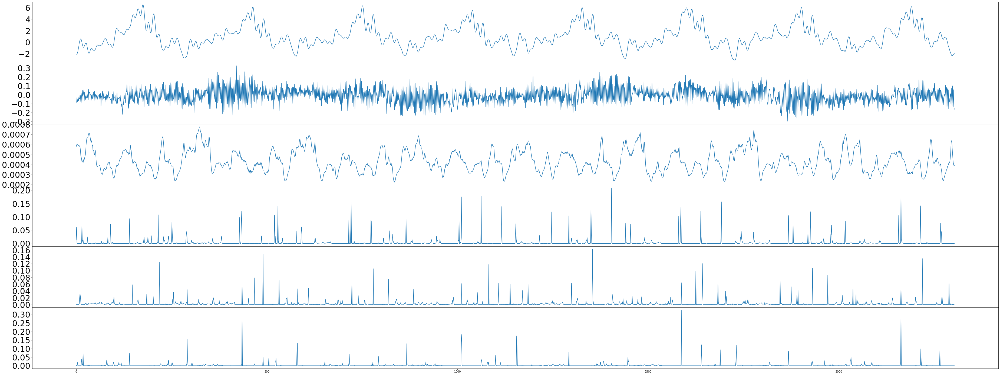

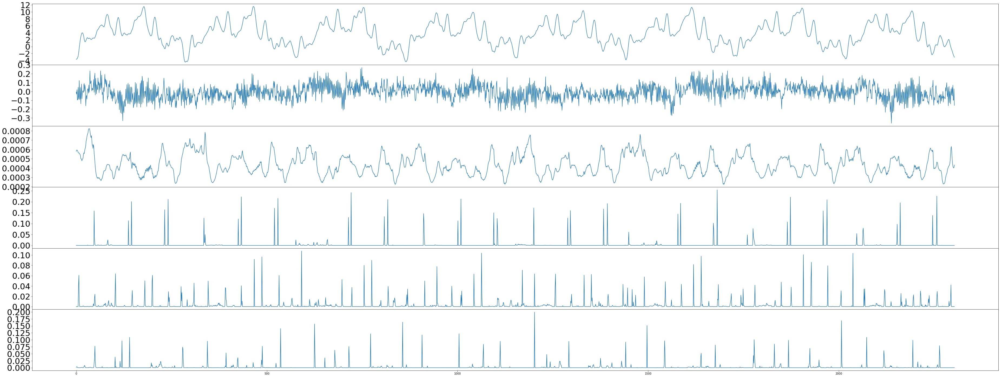

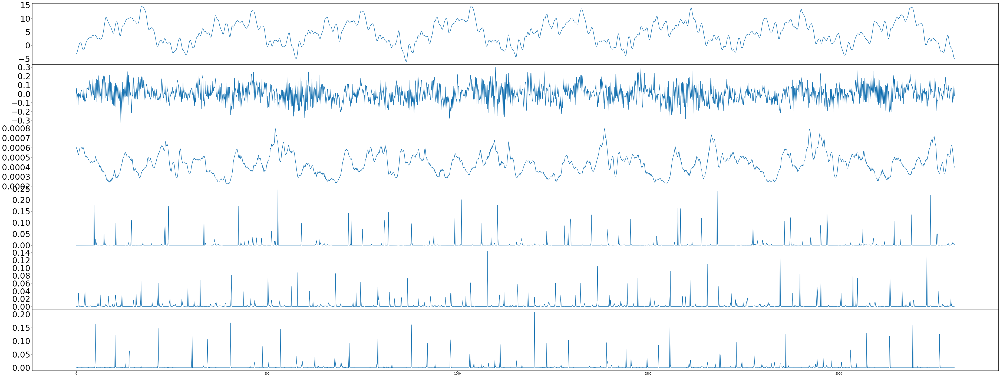

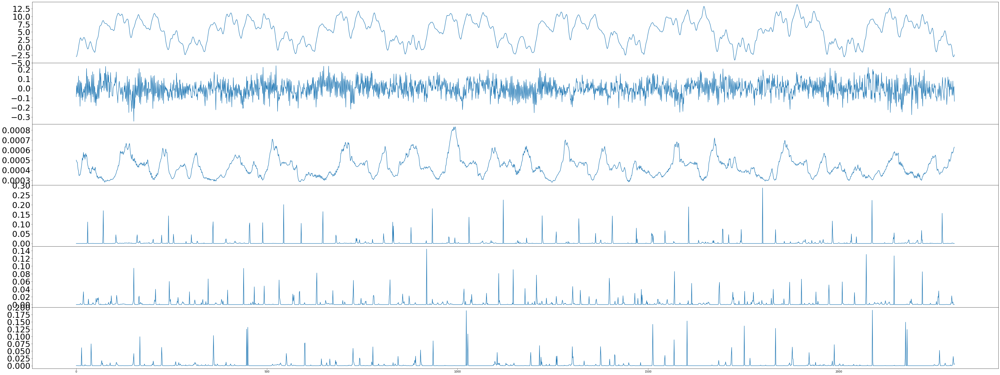

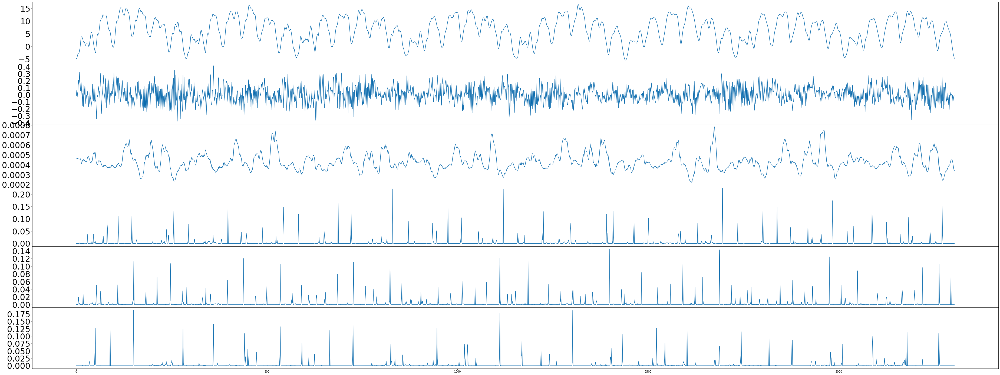

...

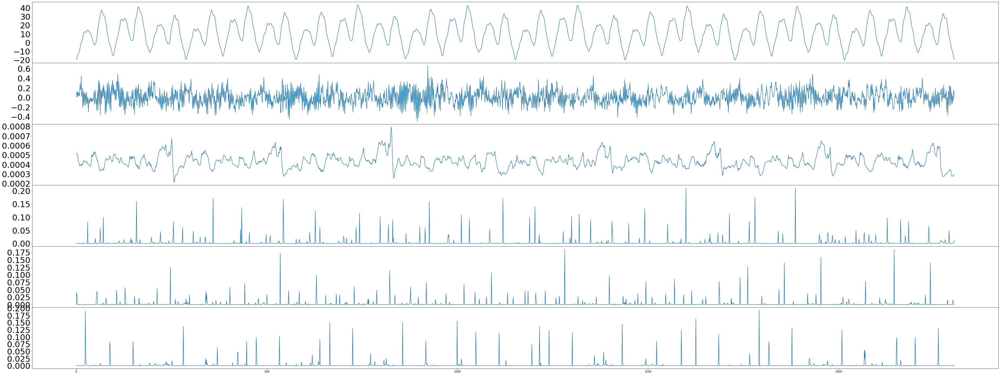

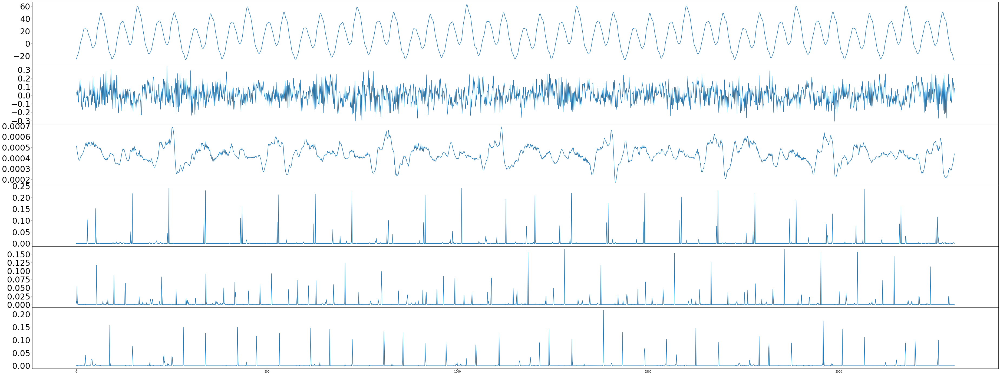

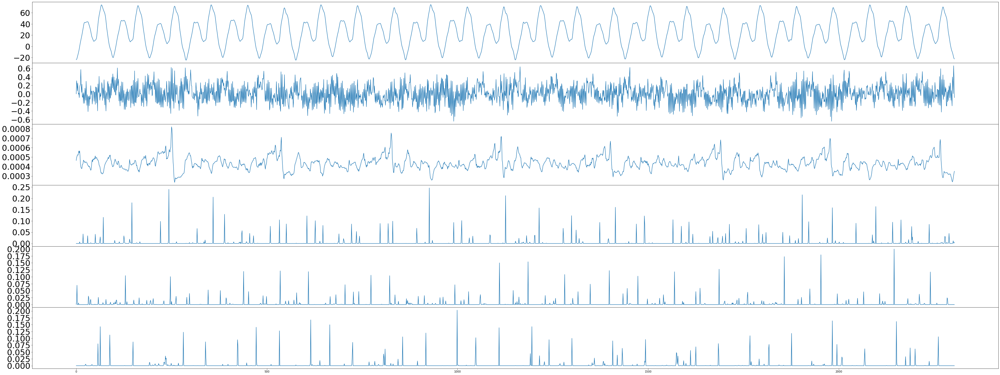

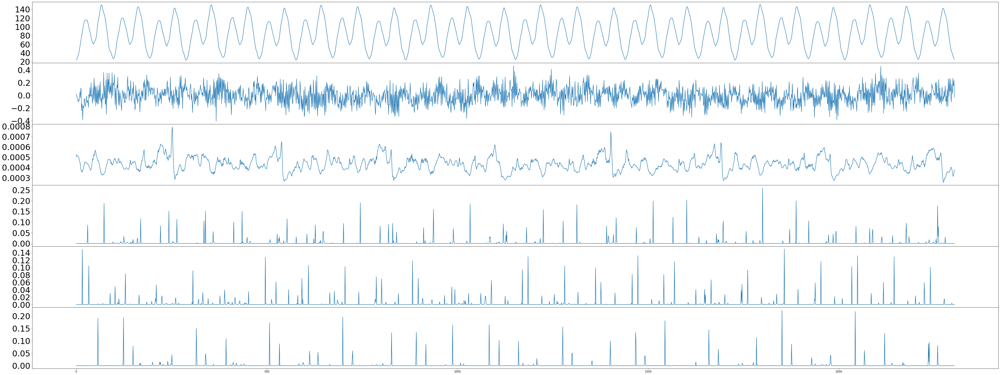

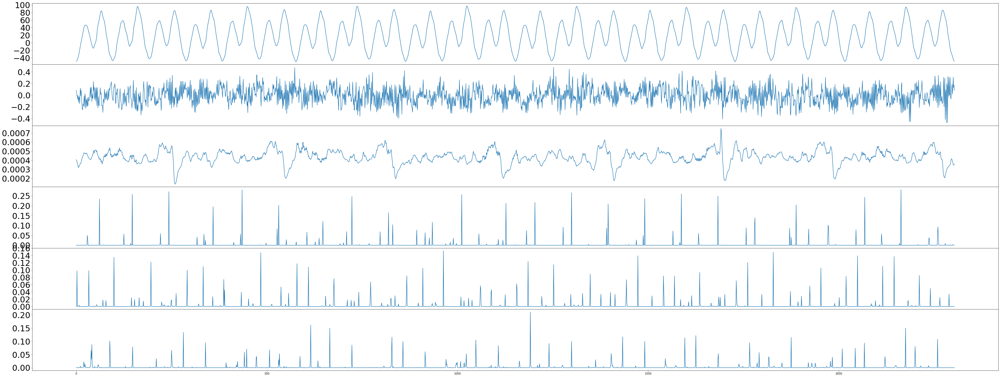

In [1]:
#
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import normalize

TESTDATA_LOADPATH = 'tool_wear_data_8/test_data.npy' #验证集数据读取路径
ATT_LOWHIGH_LOADPATH1 = 'flatten_period/attention_detail.npy'
ATT_LOWHIGH_LOADPATH2 = 'attention_distribution_dataset10/attention_detail.npy'
ATT_LOWHIGH_LOADPATH3 = 'mismatch_period/attention_detail.npy'
ATT_LOWHIGH_LOADPATH4 = 'mismatch_period_2/attention_detail.npy'

def gaussian_filtering(variation, filter_length, input_x):   #一维高斯滤波，输入方差、滤波器长度和输入
    filter_x = np.array(np.arange(-filter_length/2, filter_length/2))
    gauss_filter = np.exp(-pow(filter_x, 2)/(2*pow(variation, 2)))/(variation*np.sqrt(2*np.pi))
    gauss_filter = gauss_filter/np.sum(gauss_filter)
#     plt.plot(gauss_filter)
#     plt.show()
    filted_signal = np.convolve(input_x, gauss_filter, mode='same')
    return filted_signal

sample_index = np.arange(3,1250,100)
gauss_variation = 1.5 #越大越平滑
gauss_length = 20
#######################################################################################################
X_test = np.load(TESTDATA_LOADPATH)
print(np.shape(X_test))
att_lowhigh_1=np.load(ATT_LOWHIGH_LOADPATH1)
att_lowhigh_2=np.load(ATT_LOWHIGH_LOADPATH2)
att_lowhigh_3=np.load(ATT_LOWHIGH_LOADPATH3)
att_lowhigh_4=np.load(ATT_LOWHIGH_LOADPATH4)

for j in sample_index:
    att_weight_gauss1 = gaussian_filtering(gauss_variation, gauss_length, att_lowhigh_1[j]) #gauss加窗,2304
    
    att_weight_gauss2 = gaussian_filtering(gauss_variation, gauss_length, att_lowhigh_2[j]) #gauss加窗,2304

    att_weight_gauss3 = gaussian_filtering(gauss_variation, gauss_length, att_lowhigh_3[j]) #gauss加窗,2304
    
    att_weight_gauss4 = gaussian_filtering(gauss_variation, gauss_length, att_lowhigh_4[j]) #gauss加窗,2304

    fig_x = 64
    fig_y = 25
    plt.figure(figsize=(fig_x, fig_y))
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.subplot(6,1,1)
    plt.plot(X_test[j,:, 0])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    plt.subplot(6,1,2)
    plt.plot(X_test[j,:, 3])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    plt.subplot(6,1,3)
    plt.plot(att_lowhigh_1[j])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    plt.subplot(6,1,4)
    plt.plot(att_lowhigh_2[j])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    plt.subplot(6,1,5)
    plt.plot(att_lowhigh_3[j])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    plt.subplot(6,1,6)
    plt.plot(att_lowhigh_4[j])
    plt.yticks(fontproperties = 'Times New Roman', size = 30)
    
    